<a href="https://colab.research.google.com/github/samanthastaheli/CSE450TeamProjects/blob/main/Mod4Elijah.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q -U keras-tuner

     |████████████████████████████████| 133 kB 5.1 MB/s 


In [2]:
!rm -r untitled_project 

rm: cannot remove 'untitled_project': No such file or directory


In [3]:
import pandas as pd
import tensorflow as tf
import datetime
import altair as alt
from tensorflow import keras
import keras_tuner as kt
from keras import layers
from keras.layers import Dense
from keras.models import Sequential
from keras.callbacks import EarlyStopping
from keras_tuner.tuners import RandomSearch
from keras_tuner.tuners import Hyperband
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import r2_score


bikes = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes.csv')

In [4]:
bikes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16637 entries, 0 to 16636
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   dteday        16637 non-null  object 
 1   season        16637 non-null  int64  
 2   hr            16637 non-null  int64  
 3   holiday       16637 non-null  int64  
 4   workingday    16637 non-null  int64  
 5   weathersit    16637 non-null  int64  
 6   hum           16637 non-null  float64
 7   windspeed     16637 non-null  int64  
 8   temp_c        16637 non-null  float64
 9   feels_like_c  16637 non-null  float64
 10  casual        16637 non-null  int64  
 11  registered    16637 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1.5+ MB


## Data Preprocess (Initial)

In [5]:
bikes["month"] = bikes.apply(lambda x: int(x.dteday.split("/")[0]), axis=1)

In [6]:
bikes["day"] = bikes.apply(lambda x: int(x.dteday.split("/")[1]), axis=1)

In [7]:
bikes["year"] = bikes.apply(lambda x: int(x.dteday.split("/")[2]) + 2000, axis=1)

In [8]:
bikes["total_renters"] = bikes["casual"] + bikes["registered"]

In [9]:
bikes["week_day"] = bikes.apply(lambda x: datetime.date(x.year, x.month, x.day).weekday(), axis=1)

In [10]:
alt.data_transformers.disable_max_rows()
alt.Chart(bikes).mark_line().encode(alt.X("temp_c"), alt.Y("mean(total_renters)"))

alt.Chart(...)

In [11]:
alt.Chart(bikes).mark_bar().encode(alt.X("week_day:O"),alt.Y("mean(total_renters)"))

alt.Chart(...)

In [12]:
alt.Chart(bikes).mark_bar().encode(alt.X("week_day:O"),alt.Y("sum(total_renters)"))

alt.Chart(...)

In [13]:
tbell_curve = [5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4]

In [14]:
alt.Chart(bikes).mark_bar().encode(alt.X("hr:O", sort=tbell_curve),alt.Y("mean(total_renters)"))

alt.Chart(...)

In [15]:
bikes

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,casual,registered,month,day,year,total_renters,week_day
0,1/1/11,1,0,0,0,1,0.81,0,3.28,3.0014,3,13,1,1,2011,16,5
1,1/1/11,1,1,0,0,1,0.80,0,2.34,1.9982,8,32,1,1,2011,40,5
2,1/1/11,1,2,0,0,1,0.80,0,2.34,1.9982,5,27,1,1,2011,32,5
3,1/1/11,1,3,0,0,1,0.75,0,3.28,3.0014,3,10,1,1,2011,13,5
4,1/1/11,1,4,0,0,1,0.75,0,3.28,3.0014,0,1,1,1,2011,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,11/30/12,4,19,0,1,1,0.66,0,7.04,7.0010,18,359,11,30,2012,377,4
16633,11/30/12,4,20,0,1,1,0.66,0,7.04,7.0010,12,233,11,30,2012,245,4
16634,11/30/12,4,21,0,1,1,0.75,6,6.10,5.0012,14,169,11,30,2012,183,4
16635,11/30/12,4,22,0,1,1,0.75,0,6.10,5.9978,18,145,11,30,2012,163,4


In [16]:
bikes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16637 entries, 0 to 16636
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   dteday         16637 non-null  object 
 1   season         16637 non-null  int64  
 2   hr             16637 non-null  int64  
 3   holiday        16637 non-null  int64  
 4   workingday     16637 non-null  int64  
 5   weathersit     16637 non-null  int64  
 6   hum            16637 non-null  float64
 7   windspeed      16637 non-null  int64  
 8   temp_c         16637 non-null  float64
 9   feels_like_c   16637 non-null  float64
 10  casual         16637 non-null  int64  
 11  registered     16637 non-null  int64  
 12  month          16637 non-null  int64  
 13  day            16637 non-null  int64  
 14  year           16637 non-null  int64  
 15  total_renters  16637 non-null  int64  
 16  week_day       16637 non-null  int64  
dtypes: float64(3), int64(13), object(1)
memory usage: 

In [17]:
hr_bin = [-1,6,11,16,20,24]
hr_labels = ["morning_non", "morning_peak","afternoon","evening_peak","evening_non"]
bikes["time_bin"] = pd.cut(bikes["hr"], bins = hr_bin, labels = hr_labels)

In [18]:
bikes = pd.get_dummies(bikes, columns=["week_day"])

In [19]:
bikes = pd.get_dummies(bikes, columns=["time_bin"])

In [20]:
bikes

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,...,week_day_2,week_day_3,week_day_4,week_day_5,week_day_6,time_bin_morning_non,time_bin_morning_peak,time_bin_afternoon,time_bin_evening_peak,time_bin_evening_non
0,1/1/11,1,0,0,0,1,0.81,0,3.28,3.0014,...,0,0,0,1,0,1,0,0,0,0
1,1/1/11,1,1,0,0,1,0.80,0,2.34,1.9982,...,0,0,0,1,0,1,0,0,0,0
2,1/1/11,1,2,0,0,1,0.80,0,2.34,1.9982,...,0,0,0,1,0,1,0,0,0,0
3,1/1/11,1,3,0,0,1,0.75,0,3.28,3.0014,...,0,0,0,1,0,1,0,0,0,0
4,1/1/11,1,4,0,0,1,0.75,0,3.28,3.0014,...,0,0,0,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,11/30/12,4,19,0,1,1,0.66,0,7.04,7.0010,...,0,0,1,0,0,0,0,0,1,0
16633,11/30/12,4,20,0,1,1,0.66,0,7.04,7.0010,...,0,0,1,0,0,0,0,0,1,0
16634,11/30/12,4,21,0,1,1,0.75,6,6.10,5.0012,...,0,0,1,0,0,0,0,0,0,1
16635,11/30/12,4,22,0,1,1,0.75,0,6.10,5.9978,...,0,0,1,0,0,0,0,0,0,1


## Train Test Splits and HyperParameter Tuning


In [21]:
def build_model(hp):
    model = Sequential()
    model.add(layers.Flatten(input_shape=(24,)))
    model.add(Dense(units=hp.Int("units", min_value=32, max_value=512, step=32), activation="relu"))
    model.add(keras.layers.Dropout(0.2))
    model.add(Dense(units=hp.Int("units", min_value=32, max_value=512, step=32), activation="relu"))
    #Output layer
    model.add(layers.Dense(1, activation="linear"))
    #Test Learning Rates
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 2e-2, 5e-3, 1.5e-2])
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate), loss="mse", metrics=["mse"])
    return model

In [22]:
# tuner = RandomSearch(
#     hypermodel=build_model,
#     objective="val_loss",
#     max_trials=5,
#     executions_per_trial=2)

In [23]:
tuner = Hyperband(
    hypermodel=build_model,
    objective="val_loss",
    max_epochs=50,
    factor=3
) 

In [24]:
X = bikes.drop(columns=["dteday", "registered","casual", "total_renters"])
y = bikes.total_renters

In [25]:
X2, X_test, y2, y_test = train_test_split(X, y, test_size=0.1)

In [26]:
X_train, X_val, y_train, y_val = train_test_split(X2, y2, test_size=0.15)

In [27]:
X_test.shape
X_val.shape

(2246, 24)

In [28]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12727 entries, 14827 to 14593
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   season                 12727 non-null  int64  
 1   hr                     12727 non-null  int64  
 2   holiday                12727 non-null  int64  
 3   workingday             12727 non-null  int64  
 4   weathersit             12727 non-null  int64  
 5   hum                    12727 non-null  float64
 6   windspeed              12727 non-null  int64  
 7   temp_c                 12727 non-null  float64
 8   feels_like_c           12727 non-null  float64
 9   month                  12727 non-null  int64  
 10  day                    12727 non-null  int64  
 11  year                   12727 non-null  int64  
 12  week_day_0             12727 non-null  uint8  
 13  week_day_1             12727 non-null  uint8  
 14  week_day_2             12727 non-null  uint8  
 15

In [29]:
# Scale the data
minmax_scaler = preprocessing.MinMaxScaler()
X_train = minmax_scaler.fit_transform(X_train) # fit the scale to the training data
X_val = minmax_scaler.transform(X_val) # use the same scale on the validation data
X_test = minmax_scaler.transform(X_test) # use the same scale on the testing data

In [30]:
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=5)

In [31]:
tuner.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val), callbacks=[es])

Trial 87 Complete [00h 01m 08s]
val_loss: 2467.448974609375

Best val_loss So Far: 2275.8115234375
Total elapsed time: 00h 27m 45s
INFO:tensorflow:Oracle triggered exit


In [32]:
# Get the optimal hyperparameters
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is {best_hps.get('units')} and the optimal learning rate for the optimizer
is {best_hps.get('learning_rate')}.
""")


The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is 512 and the optimal learning rate for the optimizer
is 0.005.



In [33]:
print(best_hps)

## Initial Neural Network

In [34]:
model = build_model(best_hps)

In [35]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 24)                0         
                                                                 
 dense_3 (Dense)             (None, 512)               12800     
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_4 (Dense)             (None, 512)               262656    
                                                                 
 dense_5 (Dense)             (None, 1)                 513       
                                                                 
Total params: 275,969
Trainable params: 275,969
Non-trainable params: 0
_________________________________________________________________


In [36]:
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=25)

In [37]:
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=500, callbacks=[es])

Epoch 1/500
398/398 [==============================] - 4s 9ms/step - loss: 13421.0195 - mse: 13421.0195 - val_loss: 10130.5977 - val_mse: 10130.5977
Epoch 2/500
398/398 [==============================] - 3s 7ms/step - loss: 9077.9326 - mse: 9077.9326 - val_loss: 8706.8535 - val_mse: 8706.8535
Epoch 3/500
398/398 [==============================] - 3s 7ms/step - loss: 8338.0068 - mse: 8338.0068 - val_loss: 8178.4238 - val_mse: 8178.4238
Epoch 4/500
398/398 [==============================] - 3s 7ms/step - loss: 7467.4097 - mse: 7467.4097 - val_loss: 6881.6338 - val_mse: 6881.6338
Epoch 5/500
398/398 [==============================] - 3s 7ms/step - loss: 6962.0874 - mse: 6962.0874 - val_loss: 6715.3125 - val_mse: 6715.3125
Epoch 6/500
398/398 [==============================] - 3s 7ms/step - loss: 6504.6631 - mse: 6504.6631 - val_loss: 6813.9438 - val_mse: 6813.9438
Epoch 7/500
398/398 [==============================] - 3s 6ms/step - loss: 6384.3306 - mse: 6384.3306 - val_loss: 6265.0791 - 

In [38]:
# Evaluate the model on the training data
_, train_mse = model.evaluate(X_train, y_train, verbose = 1)

# Evaluate the model on the validating data
_, val_mse = model.evaluate(X_val, y_val, verbose = 1)

# Evaluate the model on the testing data
_, test_mse = model.evaluate(X_test, y_test, verbose = 1)

52/52 [==============================] - 0s 4ms/step - loss: 1580.5040 - mse: 1580.5040


In [39]:
predictions = model.predict(X_val)
r2 = r2_score(y_val, predictions)
print("Validation Set R2:",r2)

Validation Set R2: 0.9489988204160308


In [40]:
predictions = model.predict(X_test)
r2 = r2_score(y_test, predictions)
print("Test Set R2:",r2)

Test Set R2: 0.9507920355362378


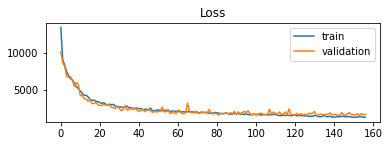

In [41]:
from matplotlib import pyplot
pyplot.subplot(211)
pyplot.title('Loss')
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='validation')
pyplot.legend()

## Post Processing/Results Analysis

In [133]:
#POST PROCESSING
df = pd.DataFrame(predictions, columns=["predicted"])
df2 = y_test.to_frame().reset_index()
df2 = df2.drop(columns=["index"])
df = pd.concat([df, df2], axis=1)
df["predicted"] = df.apply(lambda x: round(x.predicted) if x.predicted > 0 else 1, axis=1)

1

In [134]:
df["diff"] = df.apply(lambda row : row["total_renters"] - row["predicted"], axis=1)
df["abs_diff"] = df.apply(lambda row : abs(row["total_renters"] - row["predicted"]), axis=1)

In [135]:
alt.Chart(df).mark_circle().encode(alt.X("total_renters"), alt.Y("predicted"), color="abs_diff")

alt.Chart(...)